# Load library

In [1]:
import whisper
import IPython.display as ipd
import torch
import numpy as np
import matplotlib.pyplot as plt

# Load pre-trained model

In [2]:
#model = whisper.load_model("tiny")
#model = whisper.load_model("base")
#model = whisper.load_model("small")
model = whisper.load_model("medium")
#model = whisper.load_model("large")

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

print(device)
print(model.device)

cuda:0
cuda:0


# define function to crop audio

In [3]:
def get_30s_aud(audio_in, start_sec_in):

    arr_stt = min(start_sec_in*16000, audio_in.shape[0] - 30*16000)
    arr_end = min(arr_stt + 30*16000, audio_in.shape[0])
    
    audio_out = audio_in[start_sec_in*16000:start_sec_in*16000+30*16000]
    return audio_out

# Load an audio file

In [27]:
# load audio and pad/trim it to fit 30 seconds
audio = whisper.load_audio("./Farewell_my_love.mp3")
#audio_trim = whisper.pad_or_trim(audio)

audio_trim1 = get_30s_aud(audio, 42)
audio_trim2 = get_30s_aud(audio, 52)

In [28]:
print(audio.shape)
print(audio.shape[0]/16000)
print(audio_trim.shape)
print(audio_trim.shape[0]/16000)

(5288124,)
330.50775
(480000,)
30.0


In [29]:
ipd.Audio(audio, rate=16000)

In [30]:
ipd.Audio(audio_trim1, rate=16000)

In [31]:
ipd.Audio(audio_trim2, rate=16000)

# Calculate mel spectrogram

In [38]:
# make log-Mel spectrogram and move to the same device as the model
mel = whisper.log_mel_spectrogram(audio).to(model.device)
mel_trim1 = whisper.log_mel_spectrogram(audio_trim1).to(model.device)
mel_trim2 = whisper.log_mel_spectrogram(audio_trim2).to(model.device)

print(mel.shape)
print(mel_trim1.shape)
print(mel_trim2.shape)

torch.Size([80, 33050])
torch.Size([80, 3000])
torch.Size([80, 3000])


In [39]:
# move data to CPU for spectrogram plot

In [40]:
mel_cpu = mel.to("cpu")
mel_trim1_cpu = mel_trim1.to("cpu")
mel_trim2_cpu = mel_trim2.to("cpu")

print(mel_cpu.shape)
print(mel_trim1_cpu.shape)
print(mel_trim2_cpu.shape)

torch.Size([80, 33050])
torch.Size([80, 3000])
torch.Size([80, 3000])


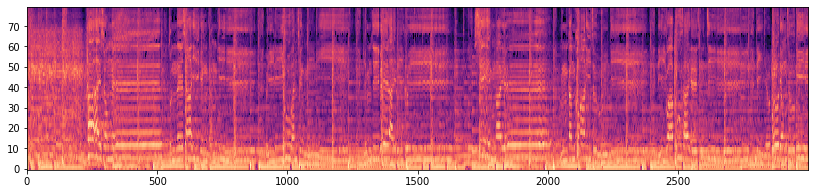

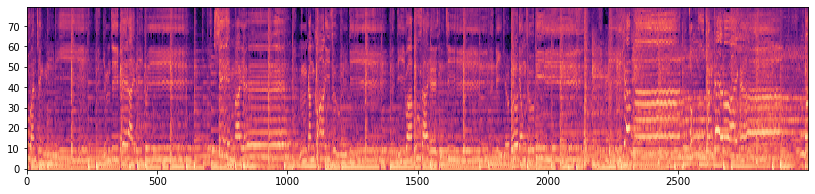

In [41]:
plt.figure(figsize=(14, 3))
plt.imshow(mel_trim1_cpu,
           interpolation ='nearest',
           cmap = 'magma',
           aspect = 'auto',
           origin ='lower')
#plt.show()

plt.figure(figsize=(14, 3))
plt.imshow(mel_trim2_cpu,
           interpolation ='nearest',
           cmap = 'magma',
           aspect = 'auto',
           origin ='lower')
plt.show()

# Auto detect Language

In [42]:
# detect the spoken language
pp_, probs = model.detect_language(mel_trim)
print(f"Detected language: {max(probs, key=probs.get)}")

Detected language: zh


In [43]:
probs

{'cs': 3.397203158783668e-07,
 'lb': 3.977940465915708e-08,
 'sl': 5.690481543751957e-07,
 'br': 0.0010668307077139616,
 'tt': 3.0136025230831365e-08,
 'nl': 7.365575811490999e-07,
 'so': 1.8768913605526905e-06,
 'no': 2.6974586830874614e-07,
 'oc': 9.538588528812397e-06,
 'ko': 0.0034245599526911974,
 'mn': 0.00011057346273446456,
 'sd': 1.126312668020546e-06,
 'ne': 4.0015747799770907e-05,
 'sa': 0.00010206982551608235,
 'kk': 2.2400266971089877e-05,
 'mg': 1.3898788608912582e-07,
 'lo': 0.00027233161381445825,
 'fa': 6.889287033118308e-05,
 'is': 6.4735495470813476e-06,
 'ro': 1.0367551794843166e-06,
 'hy': 4.12687222706154e-06,
 'hi': 1.383114351938275e-07,
 'pl': 8.668598638905678e-06,
 'ca': 1.9900134873296338e-07,
 'cy': 0.00292205554433167,
 'gl': 1.9167822756571695e-05,
 'ba': 6.022507648140163e-08,
 'nn': 0.0001055523898685351,
 'lt': 1.1900106500206675e-07,
 'sv': 3.7715594203291403e-07,
 'tk': 6.537769081660372e-08,
 'pt': 1.4146760804578662e-05,
 'ln': 2.510781200726342e-0

In [44]:
print([list(probs.keys())[x] for x in np.argsort(list(probs.values()))[-3:]][::-1])
print([probs[x] for x in [list(probs.keys())[x] for x in np.argsort(list(probs.values()))[-3:]][::-1]])

['zh', 'my', 'km']
[0.8046317100524902, 0.15819497406482697, 0.007834277115762234]


# decode the audio

In [45]:
# decode the audio
options = whisper.DecodingOptions()

In [46]:
options_zh = whisper.DecodingOptions(language='zh')

In [47]:
print(options_zh)

DecodingOptions(task='transcribe', language='zh', temperature=0.0, sample_len=None, best_of=None, beam_size=None, patience=None, length_penalty=None, prompt=None, prefix=None, suppress_tokens='-1', suppress_blank=True, without_timestamps=False, max_initial_timestamp=1.0, fp16=True)


In [50]:
result_zh1 = whisper.decode(model, mel_trim1, options_zh)
result_zh2 = whisper.decode(model, mel_trim2, options_zh)

In [51]:
# print the recognized text
print(result_zh1.text)
print(result_zh2.text)

海上的 船的聲已經響起對你有安靜的味道 今次要來離開心愛的 不敢看你作為弟
有安靜迷迷 今次要來離開心愛的 不敢看你作為弟在我不知道的日子 你就不中處理


In [52]:
result_zh1

DecodingResult(audio_features=tensor([[ 0.5298, -0.2776,  0.5640,  ...,  0.3833, -0.3398,  0.7427],
        [ 0.9385,  0.0052,  0.6689,  ...,  0.6333, -0.6968,  0.5625],
        [-0.0187,  0.0326,  0.0070,  ...,  0.0136, -0.0209, -0.0177],
        ...,
        [ 1.0332,  0.2146,  0.3699,  ...,  0.1737,  0.2930,  0.2595],
        [ 0.3484,  0.9053,  0.5732,  ...,  1.5898, -0.1785,  0.5454],
        [-0.6523,  1.4395,  0.8130,  ...,  1.5527, -1.0400,  0.9839]],
       device='cuda:0', dtype=torch.float16), language='zh', language_probs=None, tokens=[50364, 20078, 5708, 1546, 220, 10256, 117, 1546, 29454, 25338, 13665, 123, 9147, 50764, 50764, 2855, 43320, 16206, 5363, 250, 1546, 17268, 6025, 220, 6480, 9487, 4275, 3763, 32662, 8949, 51164, 51164, 7945, 15157, 1546, 19021, 40205, 4200, 2166, 11914, 6344, 19630, 51514, 51514], text='海上的 船的聲已經響起對你有安靜的味道 今次要來離開心愛的 不敢看你作為弟', avg_logprob=-0.5399762471516927, no_speech_prob=0.15415596961975098, temperature=0.0, compression_ratio=0.9210526315789

In [53]:
result_zh2

DecodingResult(audio_features=tensor([[ 0.0547,  0.3494,  1.2275,  ..., -0.1122,  0.4165,  0.7241],
        [-0.4031,  0.9185,  1.7344,  ...,  0.3079, -0.5220,  2.1855],
        [-0.9580,  0.8047,  2.6699,  ..., -0.0070, -0.4028,  2.2070],
        ...,
        [ 0.4033, -0.3547,  0.4658,  ...,  0.0831, -0.3523, -0.1919],
        [-0.7852,  1.4902,  1.3633,  ...,  0.7144, -1.0889, -0.1333],
        [-1.1465,  1.8809,  1.1748,  ...,  1.0098, -1.1553,  1.0371]],
       device='cuda:0', dtype=torch.float16), language='zh', language_probs=None, tokens=[50364, 2412, 16206, 5363, 250, 3316, 115, 3316, 115, 220, 6480, 9487, 4275, 3763, 32662, 8949, 50724, 50724, 7945, 15157, 1546, 19021, 40205, 4200, 2166, 11914, 6344, 19630, 51072, 51072, 3581, 1654, 17572, 1546, 6890, 7626, 10930, 3111, 1960, 5975, 39289, 13876, 51476, 51476], text='有安靜迷迷 今次要來離開心愛的 不敢看你作為弟在我不知道的日子 你就不中處理', avg_logprob=-0.7471861097547743, no_speech_prob=0.5355798602104187, temperature=0.0, compression_ratio=0.947368421052631

In [54]:
result_zh1.tokens

[50364,
 20078,
 5708,
 1546,
 220,
 10256,
 117,
 1546,
 29454,
 25338,
 13665,
 123,
 9147,
 50764,
 50764,
 2855,
 43320,
 16206,
 5363,
 250,
 1546,
 17268,
 6025,
 220,
 6480,
 9487,
 4275,
 3763,
 32662,
 8949,
 51164,
 51164,
 7945,
 15157,
 1546,
 19021,
 40205,
 4200,
 2166,
 11914,
 6344,
 19630,
 51514,
 51514]

In [55]:
result_zh2.tokens

[50364,
 2412,
 16206,
 5363,
 250,
 3316,
 115,
 3316,
 115,
 220,
 6480,
 9487,
 4275,
 3763,
 32662,
 8949,
 50724,
 50724,
 7945,
 15157,
 1546,
 19021,
 40205,
 4200,
 2166,
 11914,
 6344,
 19630,
 51072,
 51072,
 3581,
 1654,
 17572,
 1546,
 6890,
 7626,
 10930,
 3111,
 1960,
 5975,
 39289,
 13876,
 51476,
 51476]